# Vehículos Autónomos | Proyecto Final

- Demostración de resultados en el siguiente enlace: [Simulación Final]()
- Enlace a nuestro codigo y datos de prueba: [Repositorio en  GIT]()

### Navegación Autónoma (Gpo10) MR4010.10
- Profesor titular: Dr. David Antonio Torres
- Profesor asistente: Maricarmen Vázquez Rojí

### Integrantes del Equipo 16
- A01793469 - Alberto Patraca Sotomayor
- A01794818 – Juan Ricardo Albarracin Barbosa
- A00354910 - Fabian Munoz Aguirre
- A01066428 - Erick de Jesus Hernández Cerecedo

### Librerias <a class="anchor" id="libraries" ></a>
Importamos las librerías que vamos a requerir.

In [33]:
# Importar las bibliotecas necesarias para el proyecto

# Bibliotecas para el procesamiento de datos
import numpy as np
import pandas as pd
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split

# Bibliotecas para la visualización de datos
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Bibliotecas para el aprendizaje profundo
import keras
import tensorflow as tf
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense

# Bibliotecas para el procesamiento de imágenes
import cv2
from imgaug import augmenters as iaa

# Bibliotecas para la manipulación de archivos y rutas
import os
import ntpath
import random

### Data preparation

Esta seccion se realizarán las operaciones necesarias para preparar nuestro conjunto de datos antes de ejecutar el modelo de aprendizaje profundo.

In [34]:
# Función para obtener el nombre del archivo de una ruta
def path_leaf(path):
    # : This module provides os.path functionality on Windows platforms.
    # : ntpath.split() gives the file name and folder path
    head, tail = ntpath.split(path)
    return tail

# Directorio de los datos de prueba
datadir = 'navegacion-autonoma/test-data'

# Nombres de las columnas en el archivo CSV
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']

# Cargar el archivo CSV utilizando pandas
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)

# Obtener el nombre de archivo de las rutas en las columnas 'center', 'left' y 'right'
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)

data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2023_06_22_12_21_07_351.jpg,left_2023_06_22_12_21_07_351.jpg,right_2023_06_22_12_21_07_351.jpg,0.0,0.0,0,0.000006
1,center_2023_06_22_12_21_07_424.jpg,left_2023_06_22_12_21_07_424.jpg,right_2023_06_22_12_21_07_424.jpg,0.0,0.0,0,0.000022
2,center_2023_06_22_12_21_07_496.jpg,left_2023_06_22_12_21_07_496.jpg,right_2023_06_22_12_21_07_496.jpg,0.0,0.0,0,0.000002
3,center_2023_06_22_12_21_07_568.jpg,left_2023_06_22_12_21_07_568.jpg,right_2023_06_22_12_21_07_568.jpg,0.0,0.0,0,0.000008
4,center_2023_06_22_12_21_07_636.jpg,left_2023_06_22_12_21_07_636.jpg,right_2023_06_22_12_21_07_636.jpg,0.0,0.0,0,0.000009


In [35]:
def data_aumentation(df, datadir):
    # Contador para controlar la visualización de imágenes
    contador = 1
    nuevos_datos = []
    dtypes = df.dtypes  # Obtener los tipos de datos originales

    # Iterar sobre cada fila del DataFrame
    for row in range(len(df)):
        # Leer las imágenes
        image_center= cv2.imread(os.path.join(datadir, 'IMG', df.iloc[row]['center']))
        image_izquierda= cv2.imread(os.path.join(datadir, 'IMG', df.iloc[row]['left']))
        image_derecha= cv2.imread(os.path.join(datadir, 'IMG', df.iloc[row]['right']))

        # Voltear las imágenes horizontal-mente
        image_center_flipped = cv2.flip(image_center, 1)
        image_izquierda_flipped = cv2.flip(image_izquierda, 1)
        image_derecha_flipped = cv2.flip(image_derecha, 1)

        # Visualizar imágenes originales y volteadas
        if contador == 3:
            fig, axs = plt.subplots(1, 2, figsize=(15, 10))
            fig.tight_layout()

            axs[0].imshow(image_center)
            axs[0].set_title('Original Image')

            axs[1].imshow(image_center_flipped)
            axs[1].set_title('Flipped Image')

            contador += 1

        # Nombre de las nuevas imágenes
        image_center_nombre = df.iloc[row]['center'].replace('.jpg', '_flipped.jpg')
        image_izquierda_nombre = df.iloc[row]['left'].replace('.jpg', '_flipped.jpg')
        image_derecha_nombre = df.iloc[row]['right'].replace('.jpg', '_flipped.jpg')

        # Guardar las nuevas imágenes volteadas
        cv2.imwrite(os.path.join(datadir, 'IMG', image_center_nombre), image_center_flipped)
        cv2.imwrite(os.path.join(datadir, 'IMG', image_izquierda_nombre), image_izquierda_flipped)
        cv2.imwrite(os.path.join(datadir, 'IMG', image_derecha_nombre), image_derecha_flipped)

        # Agregar los nuevos datos a la lista
        nuevos_datos.append([
            image_center_nombre,
            image_izquierda_nombre,
            image_derecha_nombre,
            np.float64(df.iloc[row]['steering'] * -1),
            np.float64(df.iloc[row]['throttle']),
            np.int64(df.iloc[row]['reverse']),
            np.float64(df.iloc[row]['speed'])
        ])

    # Crear un nuevo DataFrame con los nuevos datos
    df_nuevos = pd.DataFrame(nuevos_datos, columns=columns)
    df_nuevos = df_nuevos.astype(dtypes)

    return df_nuevos

In [36]:
# Duplicado de datos donde el volante gira a la izquierda
grupo_izquierda = data[data['steering'] < 0]
grupo_izquierda = data_aumentation(grupo_izquierda, datadir)

# Duplicado de datos donde el volante gira a la derecha
grupo_derecha = data[data['steering'] > 0]
grupo_derecha = data_aumentation(grupo_derecha, datadir)

data = pd.concat([data, grupo_izquierda, grupo_derecha], ignore_index=True)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2023_06_22_12_21_07_351.jpg,left_2023_06_22_12_21_07_351.jpg,right_2023_06_22_12_21_07_351.jpg,0.0,0.0,0,0.000006
1,center_2023_06_22_12_21_07_424.jpg,left_2023_06_22_12_21_07_424.jpg,right_2023_06_22_12_21_07_424.jpg,0.0,0.0,0,0.000022
2,center_2023_06_22_12_21_07_496.jpg,left_2023_06_22_12_21_07_496.jpg,right_2023_06_22_12_21_07_496.jpg,0.0,0.0,0,0.000002
3,center_2023_06_22_12_21_07_568.jpg,left_2023_06_22_12_21_07_568.jpg,right_2023_06_22_12_21_07_568.jpg,0.0,0.0,0,0.000008
4,center_2023_06_22_12_21_07_636.jpg,left_2023_06_22_12_21_07_636.jpg,right_2023_06_22_12_21_07_636.jpg,0.0,0.0,0,0.000009


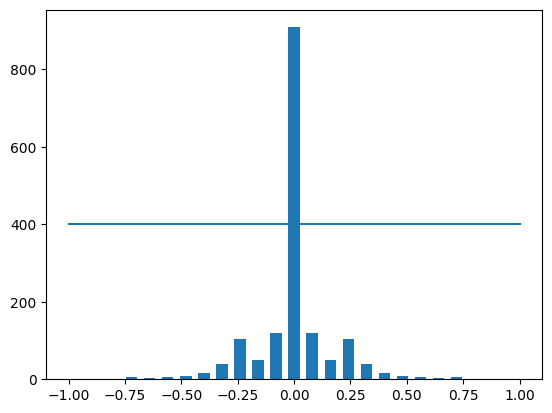

In [37]:
num_bins = 25
samples_per_bin = 400

# Calcular el histograma de los ángulos de dirección
hist, bins = np.histogram(data['steering'], num_bins)

# Calcular el centro de cada bin
center = (bins[:-1]+ bins[1:]) * 0.5

# Generar el histograma
plt.bar(center, hist, width=0.05)

# Agregar una línea para indicar el número objetivo de muestras por bin
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

total data: 1625
removed: 509
remaining: 1116


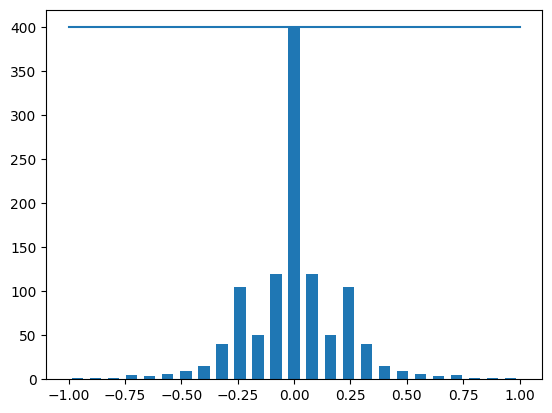

In [38]:
print('total data:', len(data))
remove_list = []

# Iterar sobre cada bin
for j in range(num_bins):
    list_ = []

    # Buscar las muestras que se encuentran dentro del bin actual
    for i in range(len(data['steering'])):
        if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
            list_.append(i)

    # Mezclar las muestras en la lista
    list_ = shuffle(list_)

    # Eliminar las muestras adicionales más allá del número objetivo
    list_ = list_[samples_per_bin:]

    # Extender la lista de muestras a eliminar
    remove_list.extend(list_)

print('removed:', len(remove_list))

# Eliminar las muestras adicionales del DataFrame
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

# Generar el histograma actualizado
hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [39]:
print(data.iloc[1])
def load_img_steering(datadir, df):
    image_path = []
    steering = []

    # Iterar sobre cada fila del DataFrame
    for i in range(len(data)):
        indexed_data = data.iloc[i]
        center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]

        # Ruta de la imagen central
        image_path.append(os.path.join(datadir, center.strip()))
        steering.append(float(indexed_data[3]))

        # Ruta de la imagen izquierda
        image_path.append(os.path.join(datadir,left.strip()))
        steering.append(float(indexed_data[3])+0.15)

        # Ruta de la imagen derecha
        image_path.append(os.path.join(datadir,right.strip()))
        steering.append(float(indexed_data[3])-0.15)

    # Convertir las listas en matrices numpy
    image_paths = np.asarray(image_path)
    steerings = np.asarray(steering)
    return image_paths, steerings

image_paths, steerings = load_img_steering(datadir + '/IMG', data)

center      center_2023_06_22_12_21_07_636.jpg
left          left_2023_06_22_12_21_07_636.jpg
right        right_2023_06_22_12_21_07_636.jpg
steering                                   0.0
throttle                                   0.0
reverse                                      0
speed                                 0.000009
Name: 4, dtype: object


### Datos de entrenamiento y validación

Se emplea la funcion 'train_test_split' para dividir los datos en conjuntos de entrenamiento y validación, el argumento test_size=0.2 indica que el 20% de los datos se utilizará para validación, mientras que el 80% se utilizará para entrenamiento.

In [40]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 2678
Valid Samples: 670


**Distribuiciones de los conjuntos de entrenamiento y validacion.**

Text(0.5, 1.0, 'Validation set')

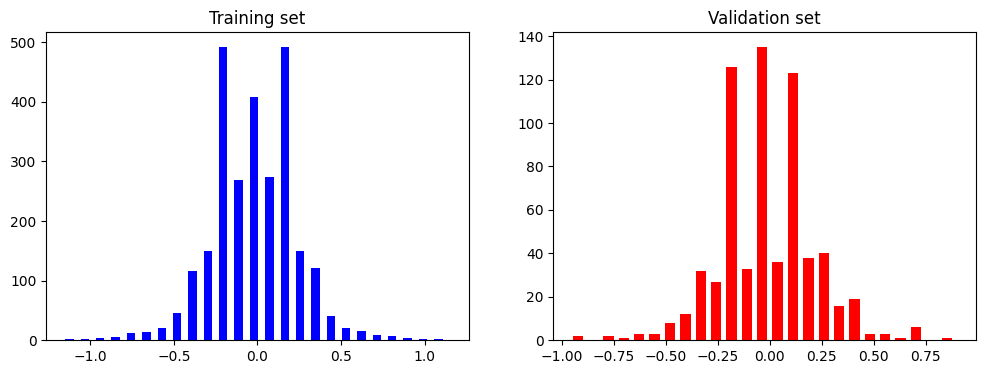

In [41]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Histograma del conjunto de entrenamiento
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')

# Histograma del conjunto de validación
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

### Procesamiento de Imagenes

En esta seccion se explorarán las imagenes y se aplicaran cambios para obtener las regiones de interes, algunos de las acciones que se realizaran las de region de interes, redimensionado y cambio de color.

Text(0.5, 1.0, 'Zoomed Image')

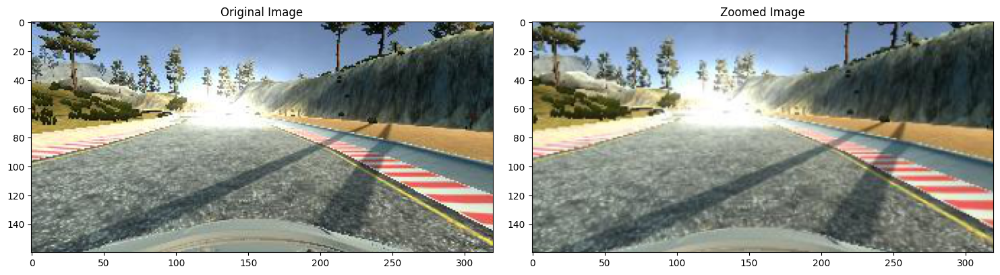

In [42]:
# Funcion para aplicar zoom a las imagenes utilizando la biblioteca imgaug
def zoom(image):
    zoom = iaa.Affine(scale=(1, 1.3))
    image = zoom.augment_image(image)
    return image

# Seleccion de una imagen aleatoria y demostración de la transformcación
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

Utilizamos la funcion de panoramización para recorrer las imagenes y centrar la regiones importantes de la imagen a la region de que será seleccionada.

Text(0.5, 1.0, 'Panned Image')

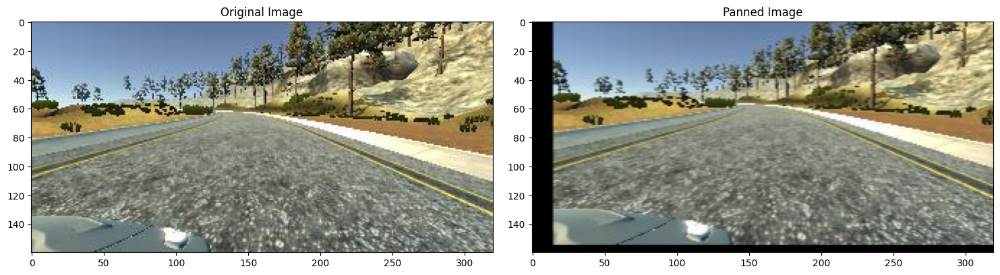

In [43]:
# Funcion para aplicar panoramización a las imagenes utilizando la biblioteca imgaug
def pan(image):
    pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
    image = pan.augment_image(image)
    return image

# Seleccion de una imagen aleatoria y demostración de la transformcación
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

Text(0.5, 1.0, 'Brightness altered image ')

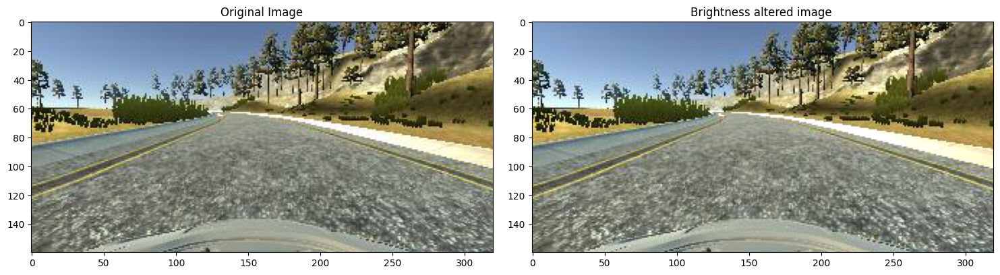

In [44]:
# Funcion para modificar el brillo de una imagen utilizando la biblioteca imgaug
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image

# Seleccion de una imagen aleatoria y demostración de la transformcación
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

Text(0.5, 1.0, 'Flipped Image - Steering Angle:0.4')

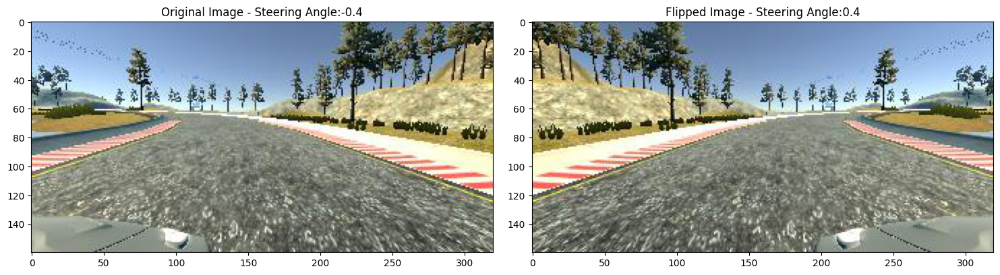

In [45]:
# Funcion que transforma una imagen dando una vuelta horizontal, tambien afecta al angulo en que gira el volante
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle

# Seleccion de una imagen aleatoria y demostración de la transformcación
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]


original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

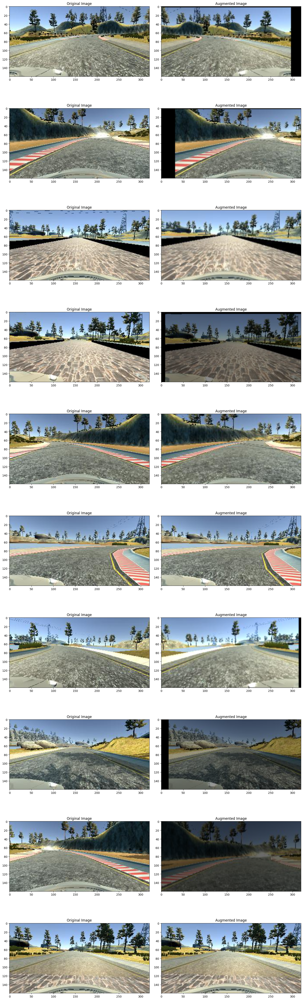

In [46]:
# Funcion que aplica aumentos de datos aleatorios a una imagen y su ángulo de dirección
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
        image = pan(image)
    if np.random.rand() < 0.5:
        image = zoom(image)
    if np.random.rand() < 0.5:
        image = img_random_brightness(image)
    if np.random.rand() < 0.5:
        image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle


ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
    randnum = random.randint(0, len(image_paths) - 1)
    random_image = image_paths[randnum]
    random_steering = steerings[randnum]

    original_image = mpimg.imread(random_image)
    # Aplicar aumentos de datos aleatorios a la imagen y el ángulo de dirección
    augmented_image, steering = random_augment(random_image, random_steering)

    axs[i][0].imshow(original_image)
    axs[i][0].set_title("Original Image")

    axs[i][1].imshow(augmented_image)
    axs[i][1].set_title("Augmented Image")

Este es el ultima transformación de la imagen, redimension y recorte, junto a un desenfoque gaussiano.

Text(0.5, 1.0, 'Preprocessed Image')

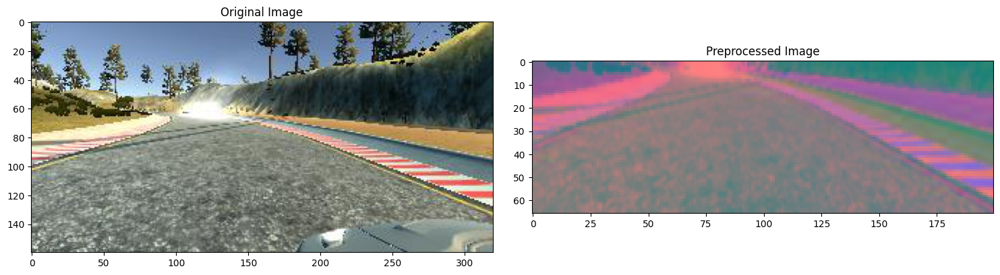

In [47]:
9# Funcion que aplica un recorte en la imagen y un desenfoque gaussiano.
def img_preprocess(img):
    # Recortar la región de interés de la imagen (eliminando la parte superior y la parte del capó del automóvil)
    img = img[60:135,:,:]
    # Convertir la imagen al espacio de color YUV
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    # Aplicar un filtro de desenfoque gaussiano para reducir el ruido
    img = cv2.GaussianBlur(img, (3, 3), 0)
    # Redimensionar la imagen a un tamaño de (200, 66) para cumplir con los requisitos del modelo
    img = cv2.resize(img, (200, 66))
    # Normalizar los valores de píxel en el rango [0, 1]
    img = img/255
    return img

# Seleccion de una imagen aleatoria y demostración de la transformcación
image = image_paths[100]
original_image = mpimg.imread(image)

# Aplicar preprocesamiento a la imagen original
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

La función batch_generator() genera lotes de imágenes y ángulos de dirección para su uso en el entrenamiento del modelo.

In [48]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):

    while True:
        batch_img = []
        batch_steering = []

        for i in range(batch_size):
            # Seleccionar un índice aleatorio para obtener una imagen y un ángulo de dirección correspondiente
            random_index = random.randint(0, len(image_paths) - 1)

            if istraining:
                # Si se está entrenando, aplicar la función de aumento aleatorio a la imagen y el ángulo de dirección
                im, steering = random_augment(image_paths[random_index], steering_ang[random_index])
            else:
                # Si no se está entrenando, simplemente cargar la imagen y el ángulo de dirección correspondiente
                im = mpimg.imread(image_paths[random_index])
                steering = steering_ang[random_index]

            # Aplicar preprocesamiento a la imagen
            im = img_preprocess(im)
            # Agregar la imagen y el ángulo de dirección a las listas del lote actual
            batch_img.append(im)
            batch_steering.append(steering)

        # Devolver el lote actual como un par de arreglos numpy
        yield (np.asarray(batch_img), np.asarray(batch_steering))

Exploracion de las imagenes en ambos conjuntos de datos, validacion y entrenamiento

Text(0.5, 1.0, 'Validation Image')

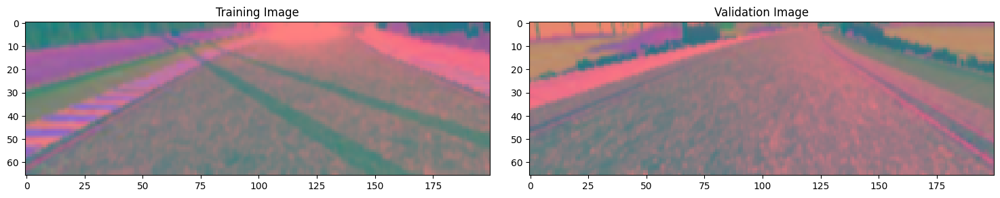

In [49]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

### Selección del Modelo NVIDIA

El modelo empleado es el "NVIDIA Model" sigue la arquitectura propuesta por la compañia NVIDIA para la conduccion autonoma.
1. Comienza con capas convolucionales para extraer características de las imágenes de entrada.
2. Luego, se agrega una capa de aplanamiento para convertir los mapas de características en un vector unidimensional.
3. Después, hay capas completamente conectadas que ayudan a aprender patrones y relaciones en los datos.
4. Finalmente, se agrega una capa de salida que produce la predicción del ángulo de dirección.

El modelo se compila con una función de pérdida de error cuadrático medio (mse) y se utiliza el optimizador Adam con una tasa de aprendizaje de 0.001.

In [50]:
def nvidia_model():
    model = tf.keras.Sequential()

    # Capas convolucionales
    model.add(tf.keras.layers.Convolution2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
    model.add(tf.keras.layers.Convolution2D(36, (5, 5), strides=(2, 2), activation='elu'))
    model.add(tf.keras.layers.Convolution2D(48, (5, 5), strides=(2, 2), activation='elu'))
    model.add(tf.keras.layers.Convolution2D(64, (3, 3), activation='elu'))
    model.add(tf.keras.layers.Convolution2D(64, (3, 3), activation='elu'))
    # model.add(tf.keras.layers.Dropout(0.5))

    # Capa de aplanamiento
    model.add(tf.keras.layers.Flatten())

    # Capas completamente conectadas
    model.add(tf.keras.layers.Dense(100, activation = 'elu'))
    model.add(tf.keras.layers.Dense(50, activation = 'elu'))
    model.add(tf.keras.layers.Dense(10, activation = 'elu'))

    # Capa de salida
    model.add(tf.keras.layers.Dense(1))

    # Compilar el modelo
    optimizer = Adam(lr=1e-3)
    model.compile(loss='mse', optimizer=optimizer)
    return model

In [51]:
# Creación del modelo utilizando la función nvidia_model()
model = nvidia_model()

# Imprimir un resumen detallado del modelo que muestra la estructura de las capas,
# los tamaños de los filtros, las formas de salida y la cantidad de parámetros entrenables.
print(model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 31, 98, 24)        1824      
                                                                 
 conv2d_6 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_7 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_8 (Conv2D)           (None, 3, 20, 64)         27712     
                                                                 
 conv2d_9 (Conv2D)           (None, 1, 18, 64)         36928     
                                                                 
 flatten_1 (Flatten)         (None, 1152)              0         
                                                                 
 dense_4 (Dense)             (None, 100)              

/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


### Entrenamiento del Modelo

En estas lineas se entrena el modelo utilizando el método  fit_generator() de Keras, se proporcionan los generadores de lotes de entrenamiento y validación.

Estamos trabajando con 10 Epochs y 300 iteraciones por cada una de ellas, con 200 pasos de validación,

In [52]:
# Entrenamiento del modelo utilizando el generador de lotes de datos
history = model.fit_generator(
    batch_generator(X_train, y_train, 100, 1),  # Generador de lotes de entrenamiento
    steps_per_epoch=300,                        # Número de pasos por época
    epochs=20,                                  # Número de épocas de entrenamiento
    validation_data=batch_generator(X_valid, y_valid, 100, 0),      # Generador de lotes de validación
    validation_steps=200,                       # Número de pasos de validación
    verbose=1,                                  # Nivel de verbosidad durante el entrenamiento
    shuffle = 1)                                # Indicador de si se deben barajar los datos en cada época

<ipython-input-52-ece5489f20d5>:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


Epoch 1/20
300/300 [==============================] - 133s 444ms/step - loss: 0.0774 - val_loss: 0.0389
Epoch 2/20
300/300 [==============================] - 135s 451ms/step - loss: 0.0491 - val_loss: 0.0369
Epoch 3/20
300/300 [==============================] - 132s 441ms/step - loss: 0.0466 - val_loss: 0.0334
Epoch 4/20
300/300 [==============================] - 132s 440ms/step - loss: 0.0437 - val_loss: 0.0363
Epoch 5/20
300/300 [==============================] - 130s 436ms/step - loss: 0.0416 - val_loss: 0.0299
Epoch 6/20
300/300 [==============================] - 130s 435ms/step - loss: 0.0404 - val_loss: 0.0313
Epoch 7/20
300/300 [==============================] - 129s 432ms/step - loss: 0.0393 - val_loss: 0.0302
Epoch 8/20
300/300 [==============================] - 129s 433ms/step - loss: 0.0378 - val_loss: 0.0316
Epoch 9/20
300/300 [==============================] - 130s 435ms/step - loss: 0.0376 - val_loss: 0.0301
Epoch 10/20
300/300 [==============================] - 130s 433m

### Grafico de resultados "Loss VS Epoch"

Text(0.5, 0, 'Epoch')

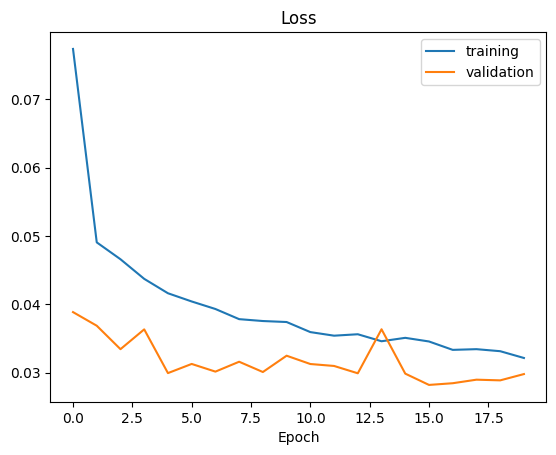

In [53]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [54]:
model.save('model24-06-23T01-59.h5')

from google.colab import files
files.download('model24-06-23T01-59.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>